# Muestreo y Cuantización en Procesamiento de Imágenes

El procesamiento digital de imágenes se basa en dos operaciones fundamentales:

* Muestreo espacial: Convertir una imagen continua en una matriz discreta de píxeles

* Cuantización: Asignar valores discretos a la intensidad de cada píxel

In [1]:
# Preparación del entorno

import numpy as np
from cv2 import imread
import matplotlib.pyplot as plt

Estas bibliotecas son fundamentales:

* NumPy: Permite trabajar con matrices (que es como se representan las imágenes)
* OpenCV (cv2): Biblioteca especializada en procesamiento de imágenes
* Matplotlib: Nos permite visualizar las imágenes y gráficos

In [2]:
# Descargamos las imágenes de ejemplo
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/images/plain/normal/gray/253027.jpg
!wget https://sipi.usc.edu/database/preview/misc/gray21.512.png
!wget https://www.dropbox.com/s/vjxcddg5rgap35i/scale.png

--2025-04-11 18:35:29--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/images/plain/normal/gray/253027.jpg
Resolving www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)... 128.32.244.190
Connecting to www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32482 (32K) [image/jpeg]
Saving to: ‘253027.jpg’

253027.jpg          100%[===================>]  31.72K  --.-KB/s    in 0.02s   

2025-04-11 18:35:29 (1.43 MB/s) - ‘253027.jpg’ saved [32482/32482]

--2025-04-11 18:35:29--  https://sipi.usc.edu/database/preview/misc/gray21.512.png
Resolving sipi.usc.edu (sipi.usc.edu)... 68.181.2.90
Connecting to sipi.usc.edu (sipi.usc.edu)|68.181.2.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 800 [image/png]
Saving to: ‘gray21.512.png’

gray21.512.png      100%[===================>]     800  --.-KB/s    in 0s      

2025-04-11 18:35:29 (587 MB/s) - ‘gray21.512.p

## Visualización y análisis de la imagen original

In [3]:
# Muestra información básica de la imagen
def howis(img):
    print('Tamaño =', img.shape)     # Dimensiones de la matriz
    print('Máximo =', np.max(img))   # Valor más alto (más blanco)
    print('Mínimo =', np.min(img))   # Valor más bajo (más negro)

In [4]:
# 3. CARGA Y VISUALIZACIÓN DE IMAGEN ORIGINAL
X = imread('253027.jpg')    # Lee la imagen del archivo
X = X[:,:,0]               # Toma solo el primer canal (rojo)
                          # Los : significan "todos los elementos"

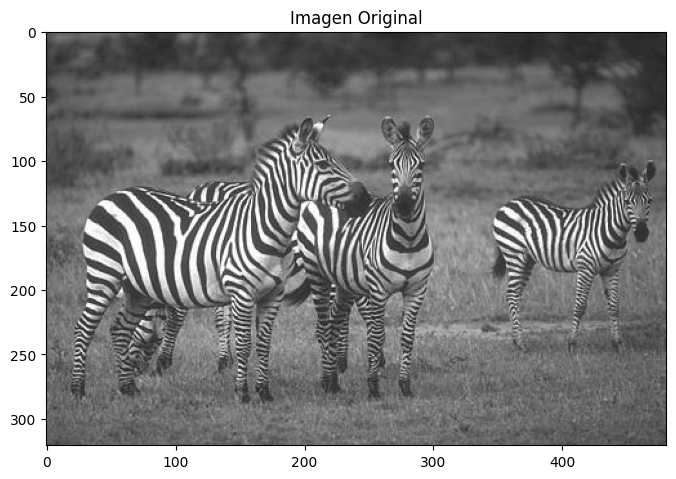

Tamaño = (321, 481)
Máximo = 255
Mínimo = 6


In [5]:
# Muestra la imagen original
plt.figure(figsize=(8,8))   # Crea figura de 8x8 pulgadas
plt.imshow(X, cmap='gray')  # Muestra imagen en escala de grises
plt.title('Imagen Original')
plt.show()                  # Muestra la figura
howis(X)                    # Muestra información

## Muestreo Espacial

El muestreo espacial reduce la resolución de una imagen tomando píxeles a intervalos regulares.

In [6]:
d = 2   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx,Mx) = X.shape          # Obtiene dimensiones de imagen original
ix = range(0,Nx,d)         # Crea secuencia de 0 a Nx saltando de d en d
jx = range(0,Mx,d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)               # Nueva anchura = número de columnas a tomar

In [7]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i,j] = X[ix[i],jx[j]]  # Copia el pixel correspondiente

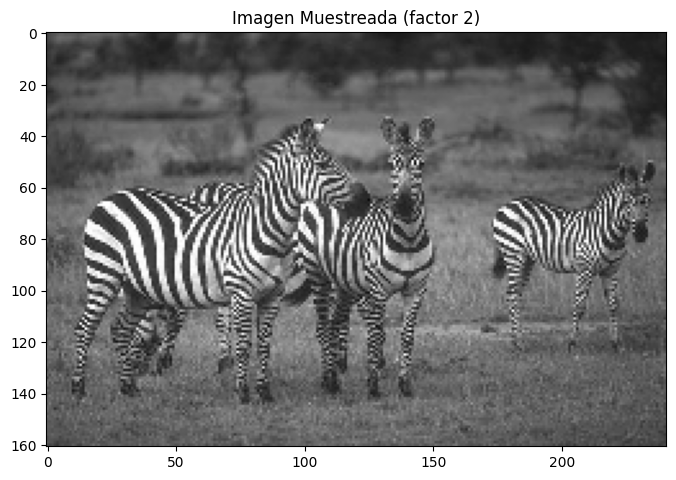

Tamaño = (161, 241)
Máximo = 255
Mínimo = 20
Resolución reducida de 321x481 a 161x241 pixels


In [8]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
howis(Y)
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

## Cuantizacion

La cuantización reduce el número de niveles de gris en la imagen.

In [9]:
q = 32                  # Factor de cuantización
# Divide por q, redondea hacia abajo y multiplica por q
Z = np.floor(X/q)*q      # Agrupa valores en intervalos de tamaño q
Z = Z.astype(np.uint8)   # Convierte a enteros 0-255

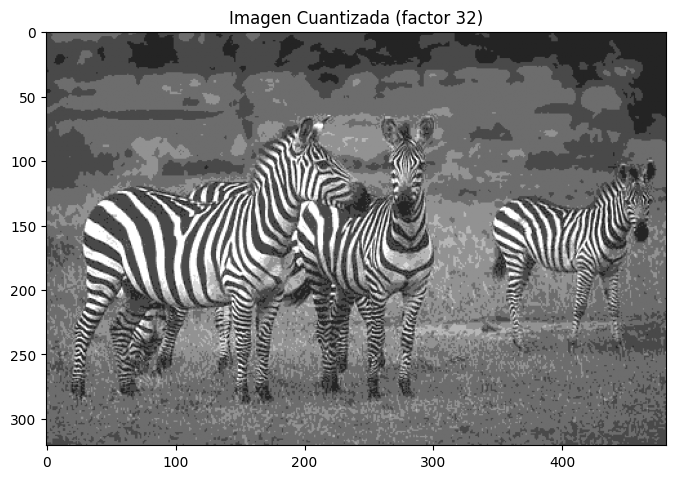

Tamaño = (321, 481)
Máximo = 224
Mínimo = 0
Esta imagen tiene 8 niveles de gris (original: 256)


In [10]:
# Muestra imagen cuantizada
plt.figure(figsize=(8,8))
plt.imshow(Z, cmap='gray')
plt.title(f'Imagen Cuantizada (factor {q})')
plt.show()
howis(Z)
print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 256)')

## Histograma de la imagen

El histograma muestra la distribución de los niveles de gris en la imagen.

In [11]:
def hist(img):
    h = np.zeros(256)           # Vector para contar ocurrencias
    for i in range(img.shape[0]):    # Para cada fila
        for j in range(img.shape[1]): # Para cada columna
            h[img[i,j]] += 1         # Incrementa contador del valor
    return h

VISUALIZACIÓN DE HISTOGRAMAS

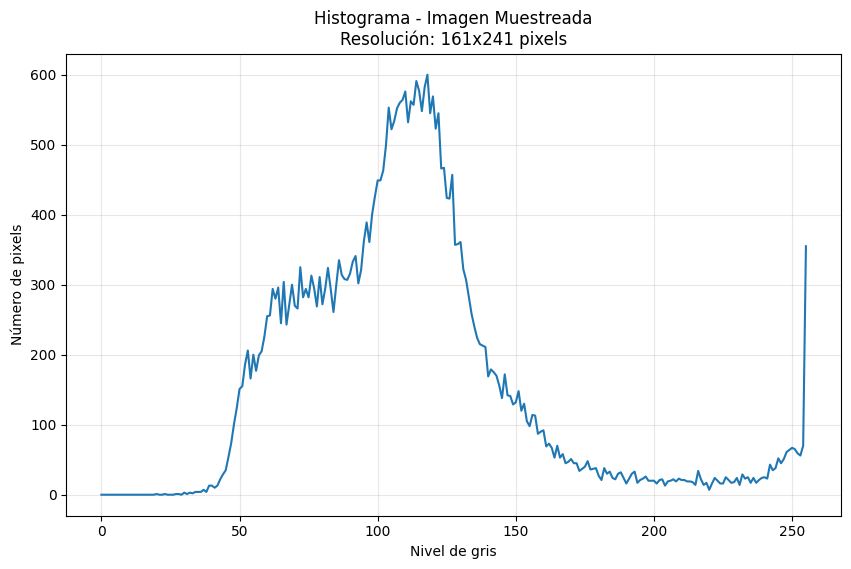

In [12]:
# Histograma imagen muestreada
plt.figure(figsize=(10,6))
plt.plot(hist(Y))
plt.title(f'Histograma - Imagen Muestreada\nResolución: {Ny}x{My} pixels')
plt.xlabel('Nivel de gris')
plt.ylabel('Número de pixels')
plt.grid(True, alpha=0.3)
plt.show()

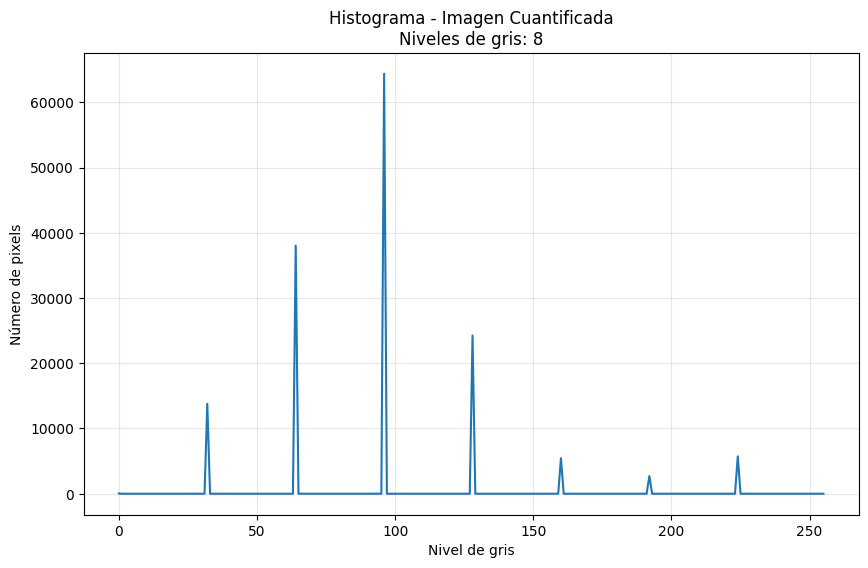

In [13]:
# Histograma imagen cuantizada
plt.figure(figsize=(10,6))
plt.plot(hist(Z))
plt.title(f'Histograma - Imagen Cuantificada\nNiveles de gris: {int(256/q)}')
plt.xlabel('Nivel de gris')
plt.ylabel('Número de pixels')
plt.grid(True, alpha=0.3)
plt.show()

### Conceptos clave para reforzar

* Resolución espacial: Número de píxeles en la imagen (afectado por el muestreo)
* Profundidad de bits: Número de niveles de gris posibles (afectado por la cuantización)
* Aliasing: Efecto no deseado que aparece cuando el muestreo es insuficiente
* Posterización: Efecto visual que ocurre cuando hay pocos niveles de gris (cuantización grande)

## Ejercicios prácticos

Exploración básica: Cambiar entre las imágenes disponibles (mandril.png y scale.png) modificando la variable nombre_imagen y observar las diferencias en los resultados.

Efectos del muestreo: Experimentar con diferentes valores del factor_muestreo (2, 4, 8, etc.) y analizar:

* ¿Cómo afecta a la calidad visual de la imagen?
* ¿Cuánto se reduce el tamaño de la imagen con cada factor?
* ¿A partir de qué factor se hace notoria la pérdida de calidad?


Efectos de la cuantización: Probar con diferentes valores del factor_cuantizacion (32, 64, 128) y observar:

* ¿Cómo cambia la apariencia de la imagen?
* ¿Qué sucede con el histograma en cada caso?
* ¿En qué tipos de imágenes es más o menos notorio el efecto?

Reto de comprensión:

* ¿Qué ocurre si combinamos muestreo y cuantización en una misma imagen?
* ¿Qué proceso afecta más a la calidad percibida de la imagen?
* ¿Qué proceso permite mayor compresión de datos?

## Prueba con otras imagenes

In [15]:
!wget -O mandril.jpg https://img.freepik.com/foto-gratis/monos-mandrill-area-habitat-natural-mandrillus-sphinx_475641-600.jpg

--2025-04-11 18:52:08--  https://img.freepik.com/foto-gratis/monos-mandrill-area-habitat-natural-mandrillus-sphinx_475641-600.jpg
Resolving img.freepik.com (img.freepik.com)... 23.37.227.27, 2600:1409:9800:31::17d5:22a4, 2600:1409:9800:31::17d5:2290
Connecting to img.freepik.com (img.freepik.com)|23.37.227.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 95788 (94K) [image/jpeg]
Saving to: ‘mandril.jpg’

mandril.jpg         100%[===================>]  93.54K  --.-KB/s    in 0.04s   

2025-04-11 18:52:09 (2.10 MB/s) - ‘mandril.jpg’ saved [95788/95788]



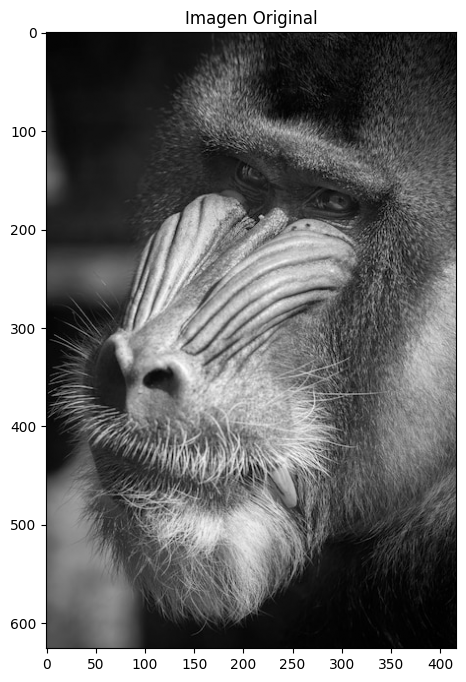

Tamaño = (626, 417)
Máximo = 250
Mínimo = 0


In [17]:
# CARGA Y VISUALIZACIÓN DE IMAGEN NUEVA
X = imread('mandril.jpg')    # Lee la imagen del archivo

#Calcula devuelve 1 canal en grises obtenido con el promedio de los 3 canales
def convertirGrises(imagen):
    pixeles=np.mean(imagen,axis=2)
    return pixeles.astype(np.uint8)

X = convertirGrises(X)

# Muestra la imagen original
plt.figure(figsize=(8,8))   # Crea figura de 8x8 pulgadas
plt.imshow(X, cmap='gray')  # Muestra imagen en escala de grises
plt.title('Imagen Original')
plt.show()                  # Muestra la figura
howis(X)                    # Muestra información

In [20]:
# Creo una funcion para resamplear la imagen
def resamplear(imagen, factor_muestreo):
    (Nx,Mx) = imagen.shape          # Obtiene dimensiones de imagen original
    ix = range(0,Nx,factor_muestreo)         # Crea secuencia de 0 a Nx saltando de d en d
    jx = range(0,Mx,factor_muestreo)         # Igual para columnas
    Ny = len(ix)               # Nueva altura = número de filas a tomar
    My = len(jx)               # Nueva anchura = número de columnas a tomar

    # Crea nueva imagen muestreada
    nueva = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
    for i in range(Ny):              # Para cada fila
        for j in range(My):          # Para cada columna
            nueva[i,j] = imagen[ix[i],jx[j]]  # Copia el pixel correspondiente
    return nueva

# Creo una funcion para cuantizacion de la imagen
def cuantizar(imagen, factor_cuantizacion):
    # Divide por factor_cuantizacion, redondea hacia abajo y multiplica por factor_cuantizacion
    nueva = np
    # Divide por q, redondea hacia abajo y multiplica por q
    nueva = np.floor(imagen/factor_cuantizacion)*factor_cuantizacion      # Agrupa valores en intervalos de tamaño q
    nueva = nueva.astype(np.uint8)   # Convierte a enteros 0-255

    return nueva

# Creo una funcion para mostrar la imagen original, la modificada y ambos histogramas
def mostrar(imagen_original, imagen_modificada, factor_muestreo, factor_cuantizacion):
    print("\n###########################################################")
    print(f"Factor de muestreo: {factor_muestreo} - Factor de cuantizacion: {factor_cuantizacion}")
    print("###########################################################\n")

    # Calcula el histograma para cada imagen
    hist_orig, bins_orig = np.histogram(imagen_original, bins=256, range=(0, 256))
    hist_modif, bins_modif = np.histogram(imagen_modificada, bins=256, range=(0, 256))

    fig, axes = plt.subplots(2, 2, figsize=(16, 16))
    axes[0,0].imshow(imagen_original, cmap='gray')
    axes[0,0].axis('off')
    axes[0,0].set_title(f'Imagen Original')
    axes[0,1].imshow(imagen_modificada, cmap='gray')
    axes[0,1].axis('off')
    axes[0,1].set_title(f'Imagen Modificada - Factor Muestreo:{factor_muestreo}, Factor Cuantizacion:{factor_cuantizacion}')
    axes[1,0].plot(bins_orig[:-1], hist_orig, color='black', label='Imagen Original', alpha=0.5)
    axes[1,0].legend()  # Muestra la leyenda para identificar cada histograma
    axes[1,0].set_title('Histograma Original')
    axes[1,1].plot(bins_modif[:-1], hist_modif, color='black', label='Imagen Modificada', alpha=0.5)
    axes[1,1].legend()  # Muestra la leyenda para identificar cada histograma
    axes[1,1].set_title('Histograma Modificado')
    plt.tight_layout()
    plt.show()



###########################################################
Factor de muestreo: 1 - Factor de cuantizacion: 8
###########################################################



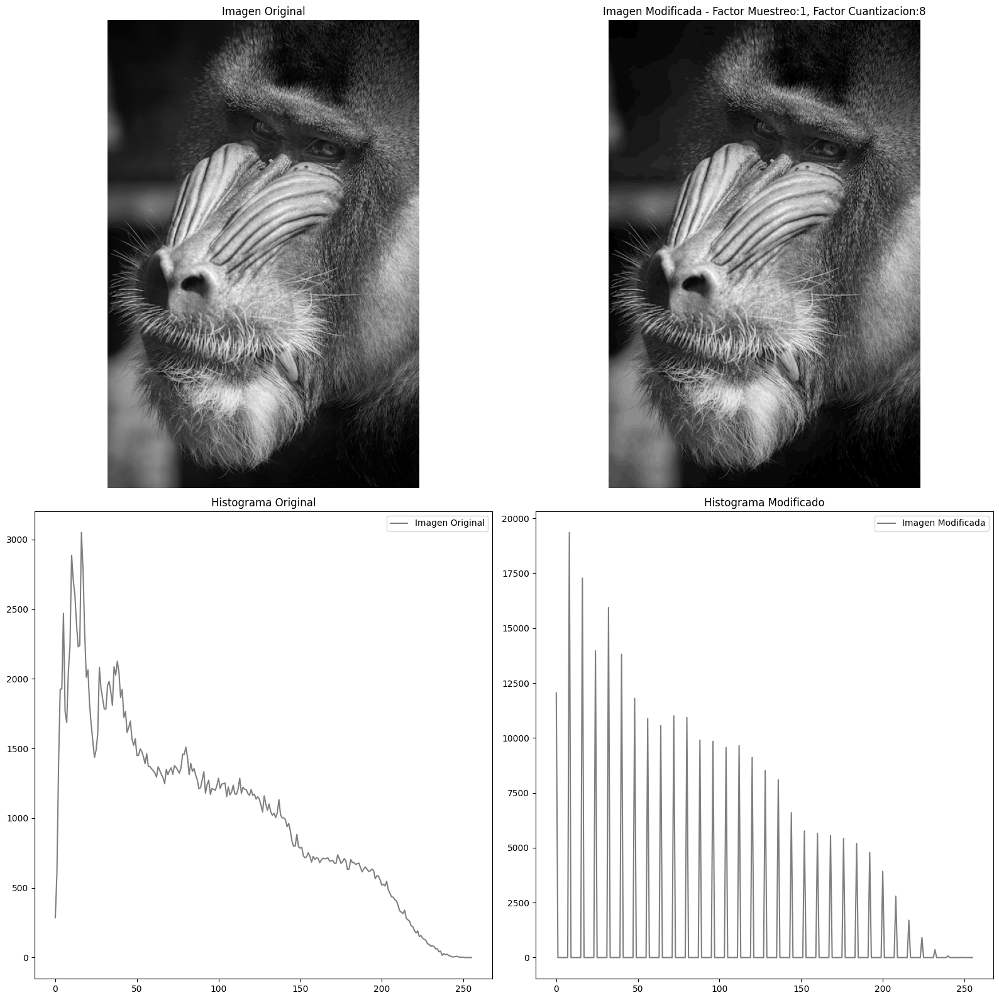


###########################################################
Factor de muestreo: 1 - Factor de cuantizacion: 16
###########################################################



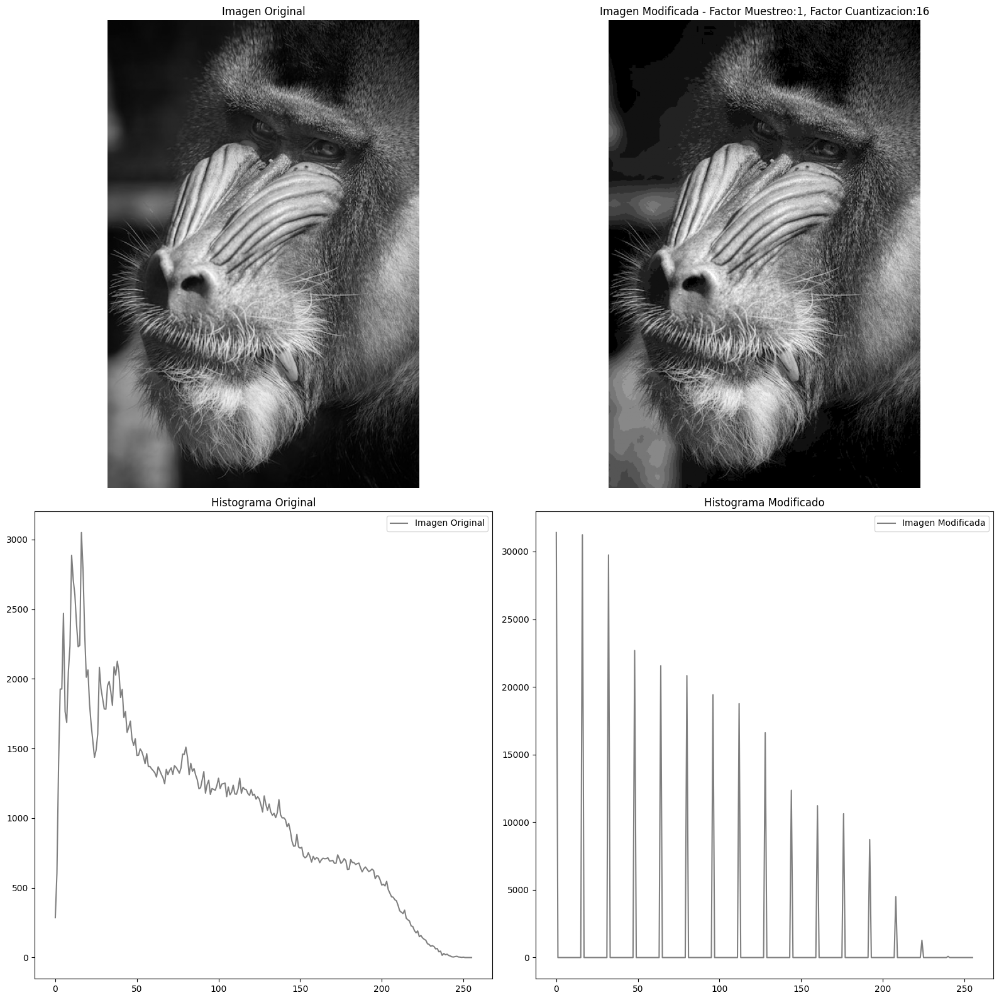


###########################################################
Factor de muestreo: 1 - Factor de cuantizacion: 32
###########################################################



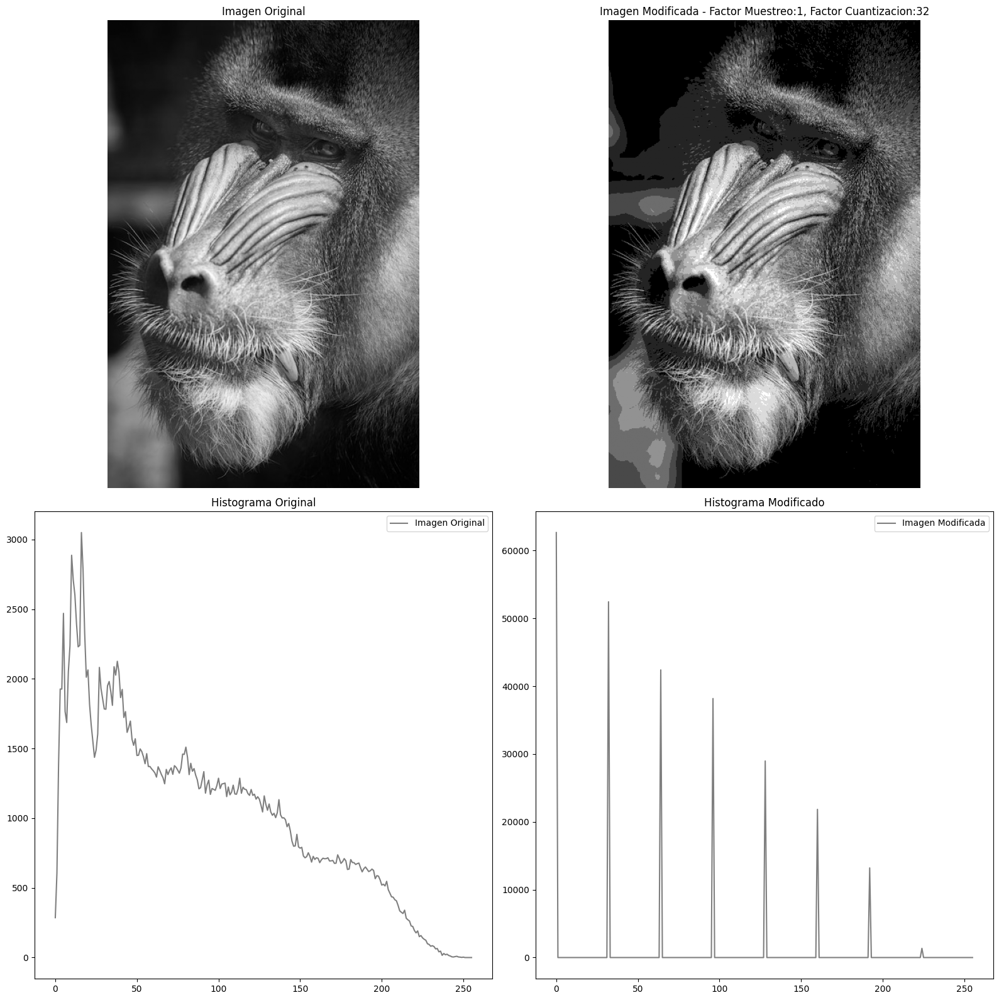


###########################################################
Factor de muestreo: 1 - Factor de cuantizacion: 64
###########################################################



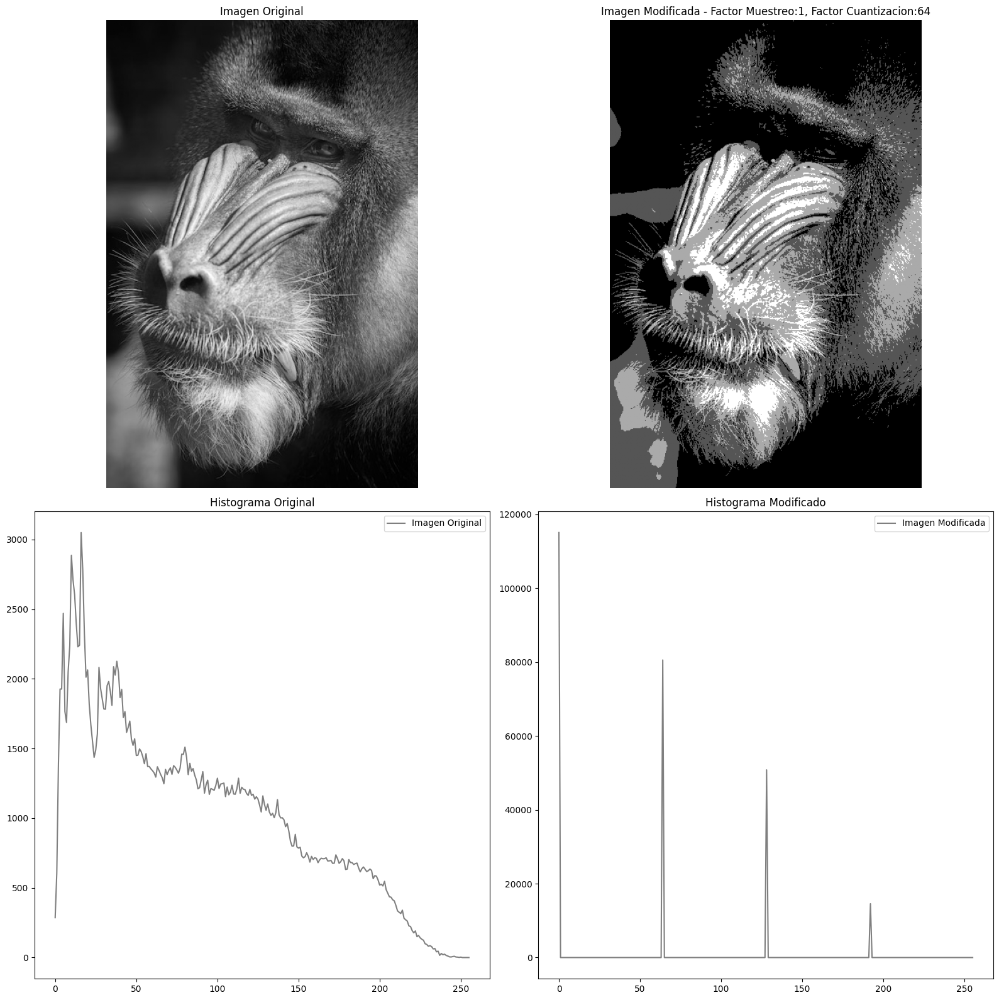


###########################################################
Factor de muestreo: 1 - Factor de cuantizacion: 128
###########################################################



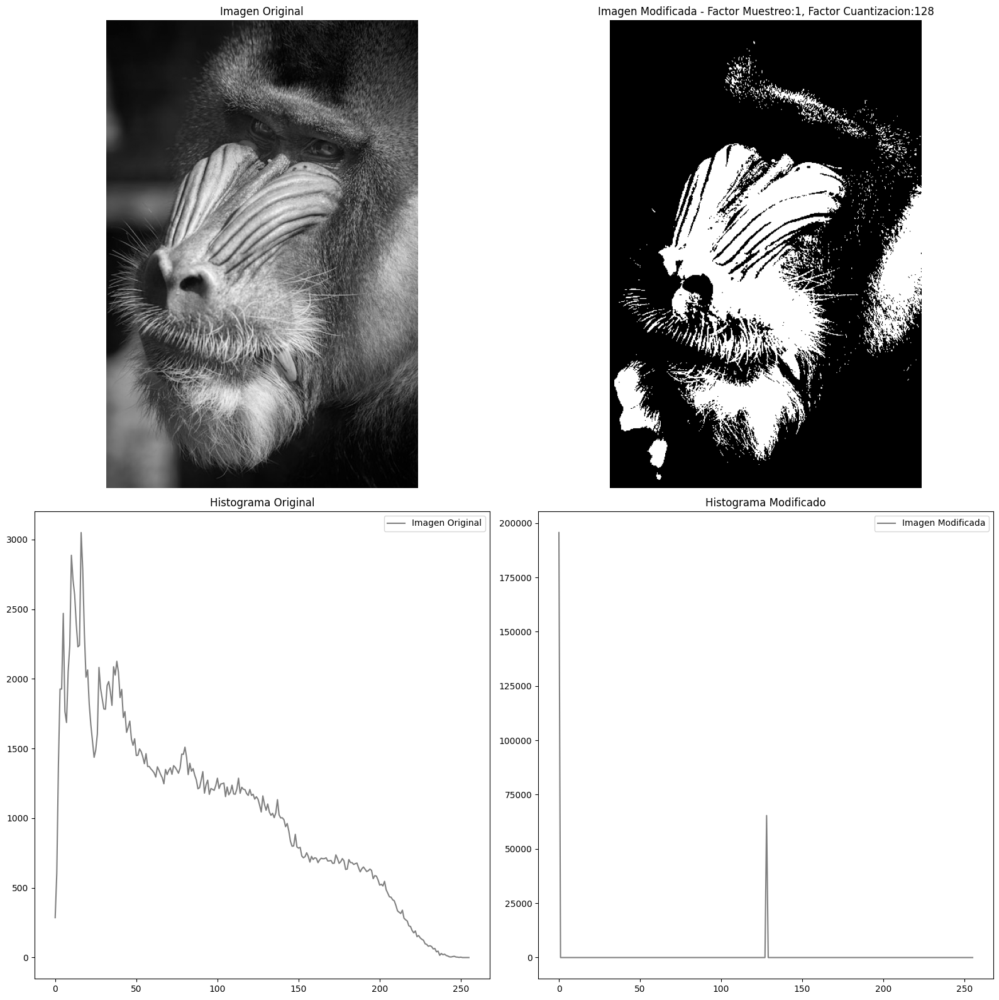


###########################################################
Factor de muestreo: 2 - Factor de cuantizacion: 8
###########################################################



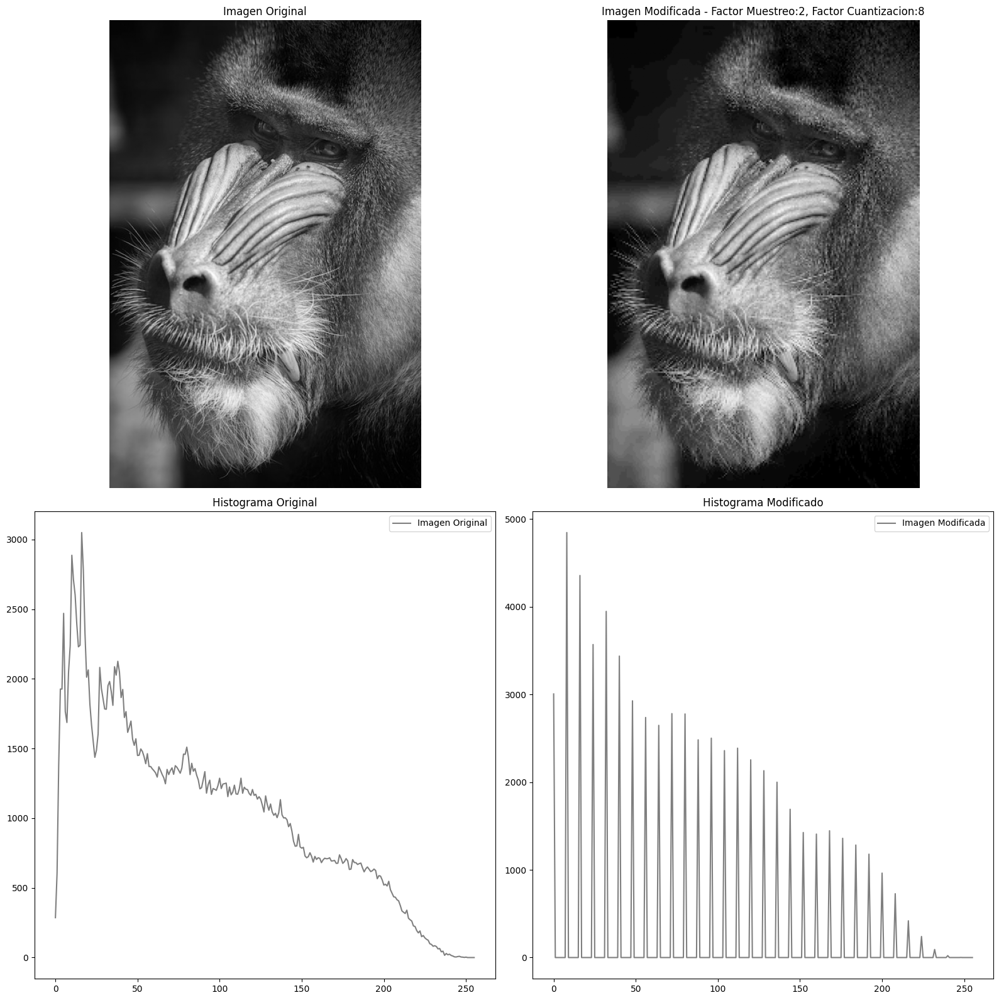


###########################################################
Factor de muestreo: 2 - Factor de cuantizacion: 16
###########################################################



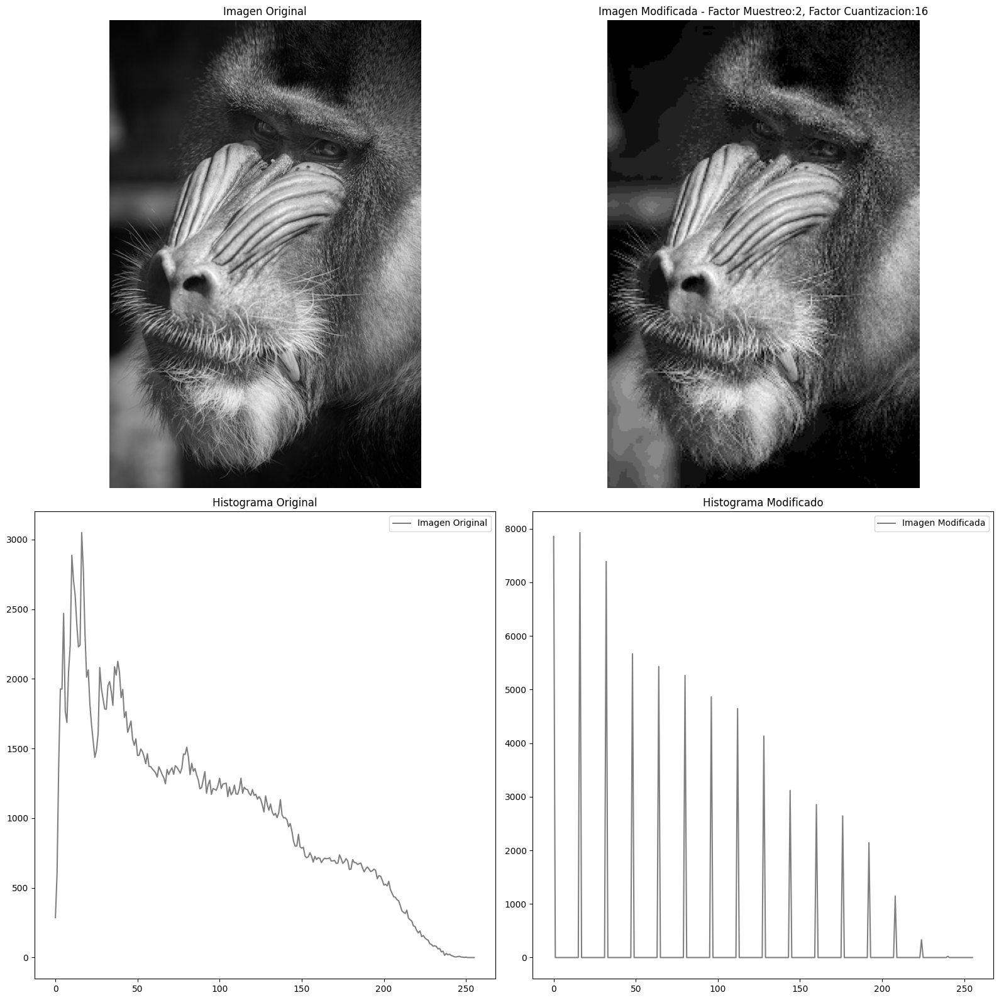


###########################################################
Factor de muestreo: 2 - Factor de cuantizacion: 32
###########################################################



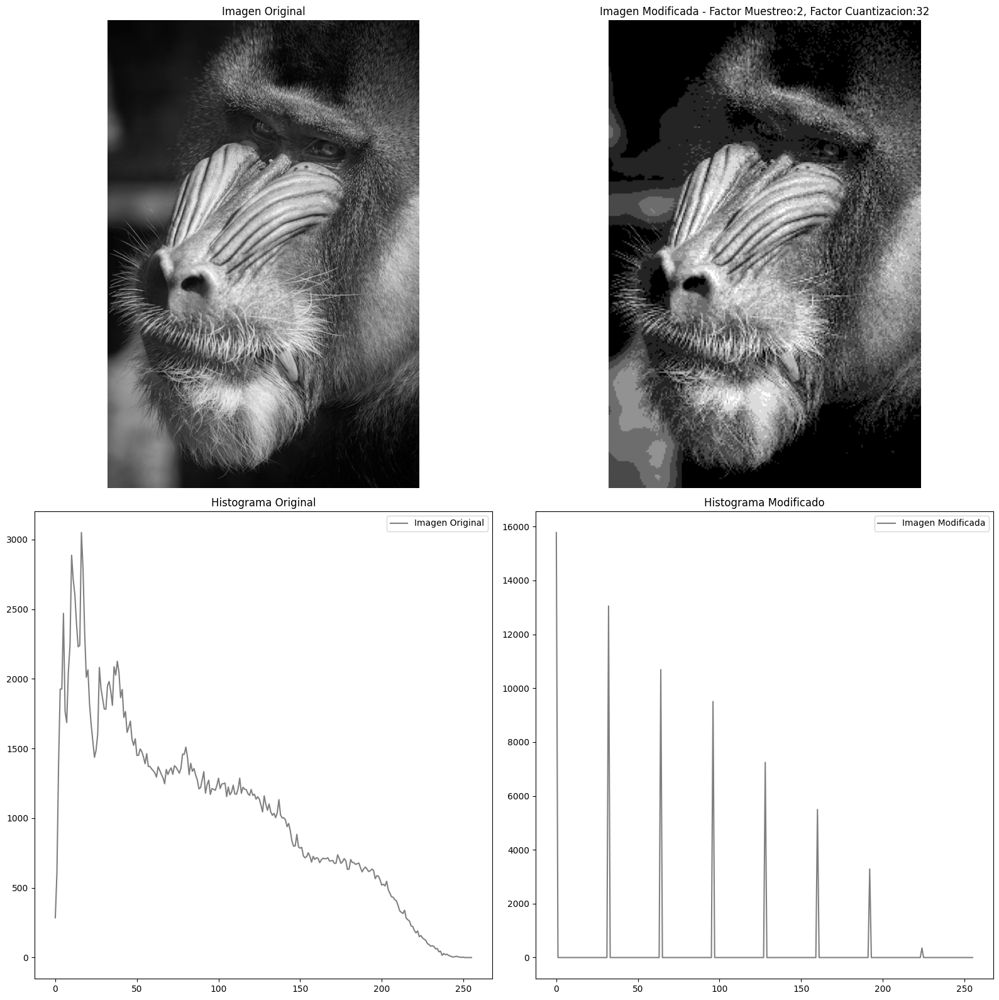


###########################################################
Factor de muestreo: 2 - Factor de cuantizacion: 64
###########################################################



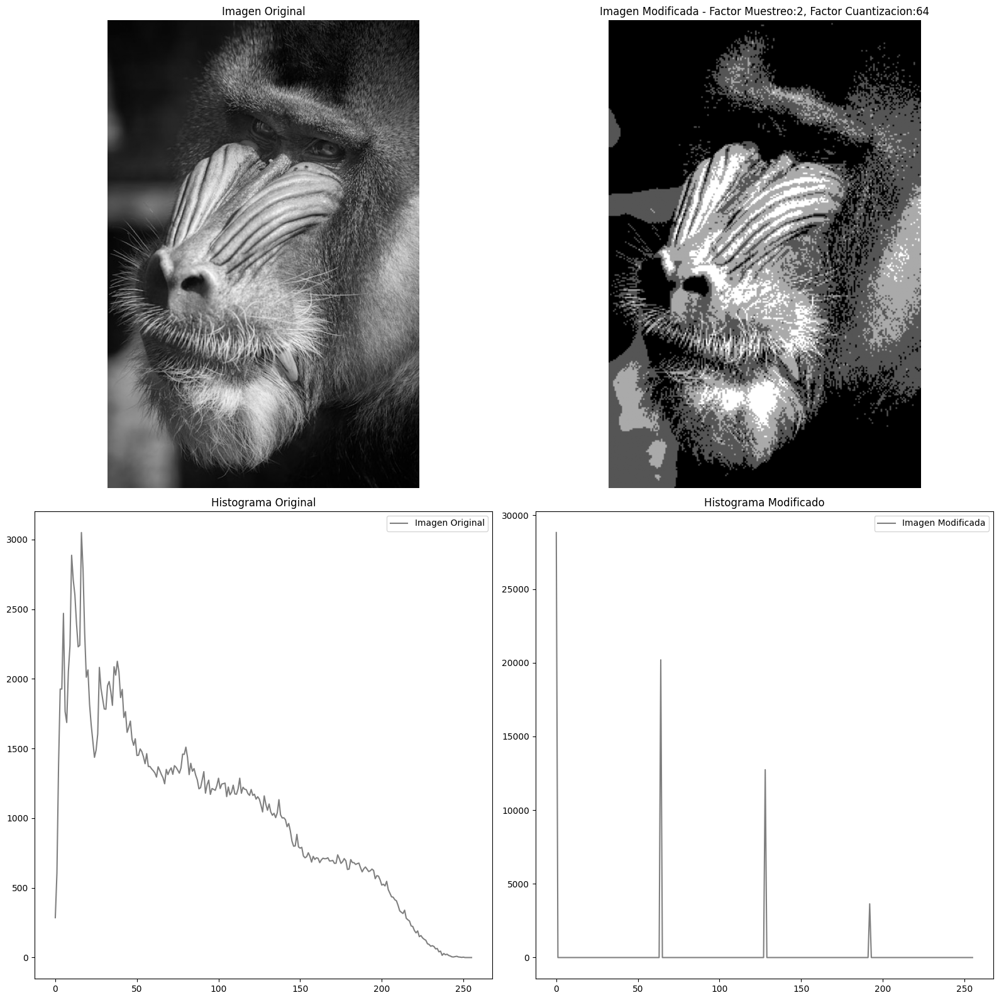


###########################################################
Factor de muestreo: 2 - Factor de cuantizacion: 128
###########################################################



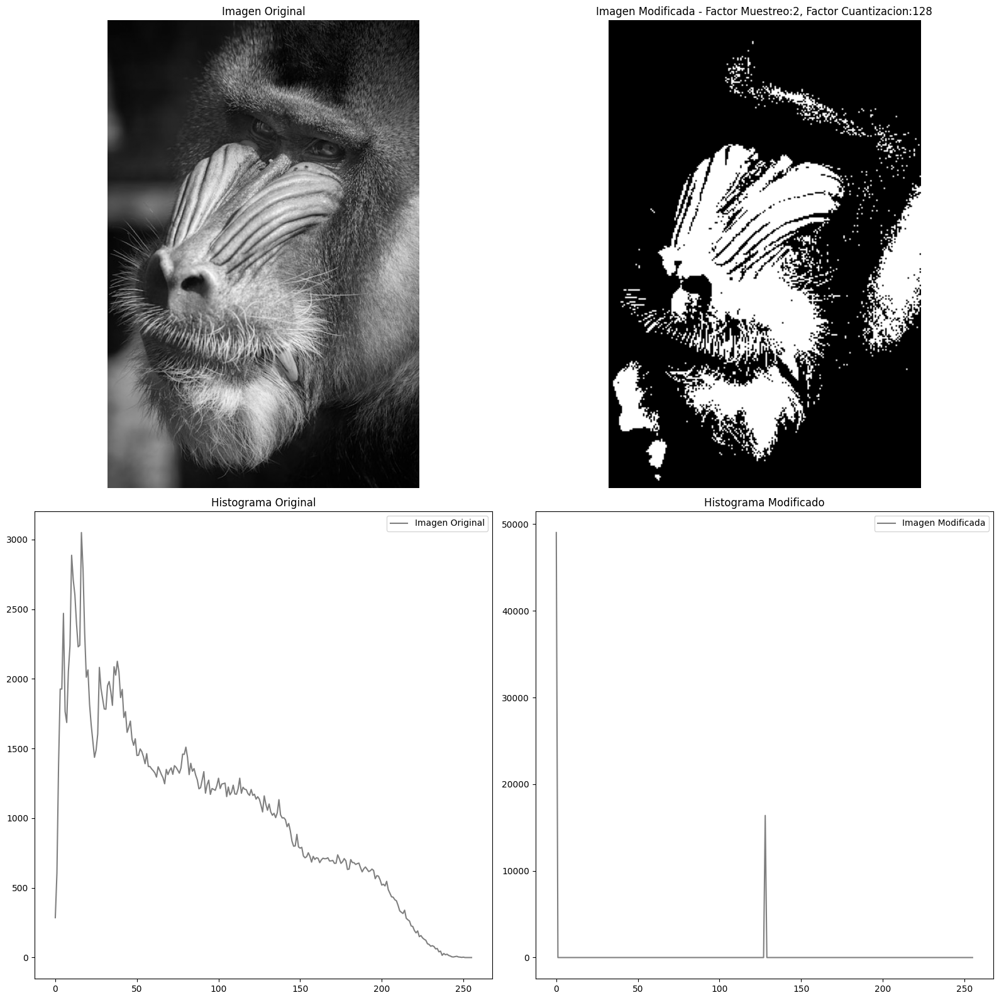


###########################################################
Factor de muestreo: 4 - Factor de cuantizacion: 8
###########################################################



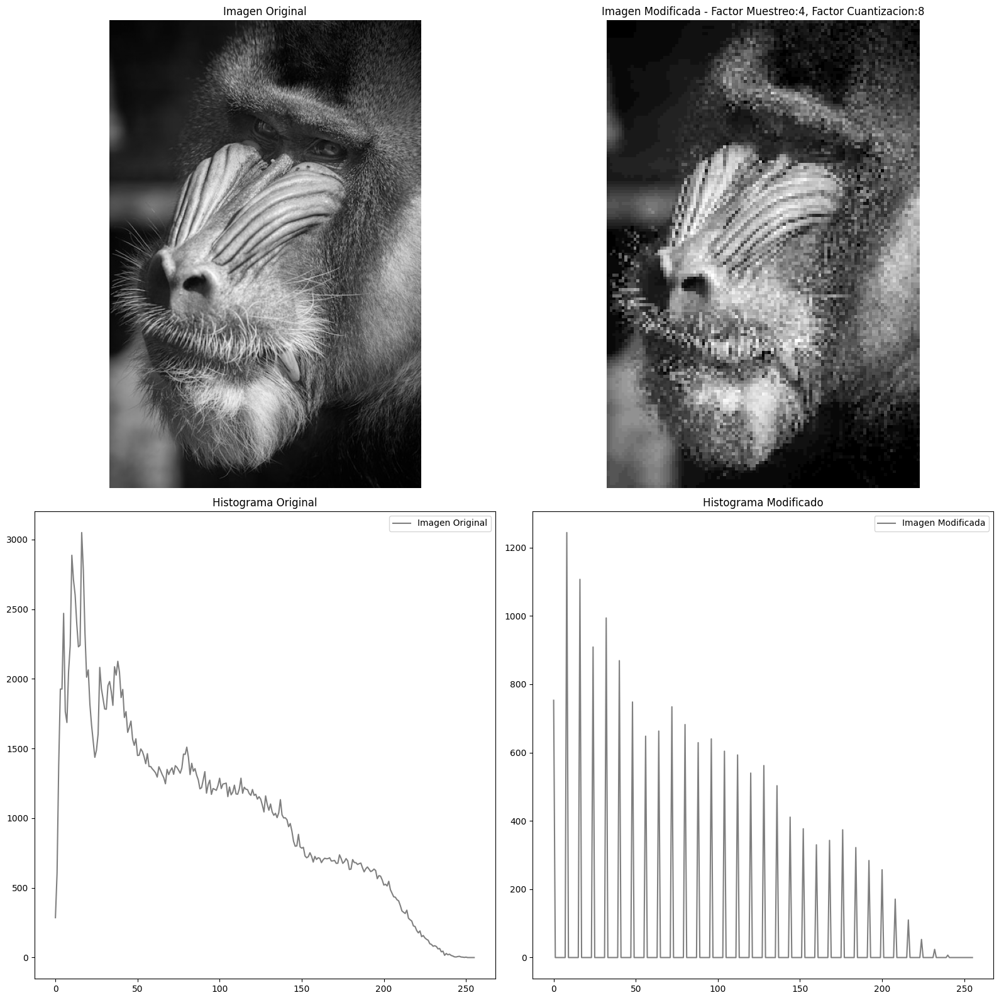


###########################################################
Factor de muestreo: 4 - Factor de cuantizacion: 16
###########################################################



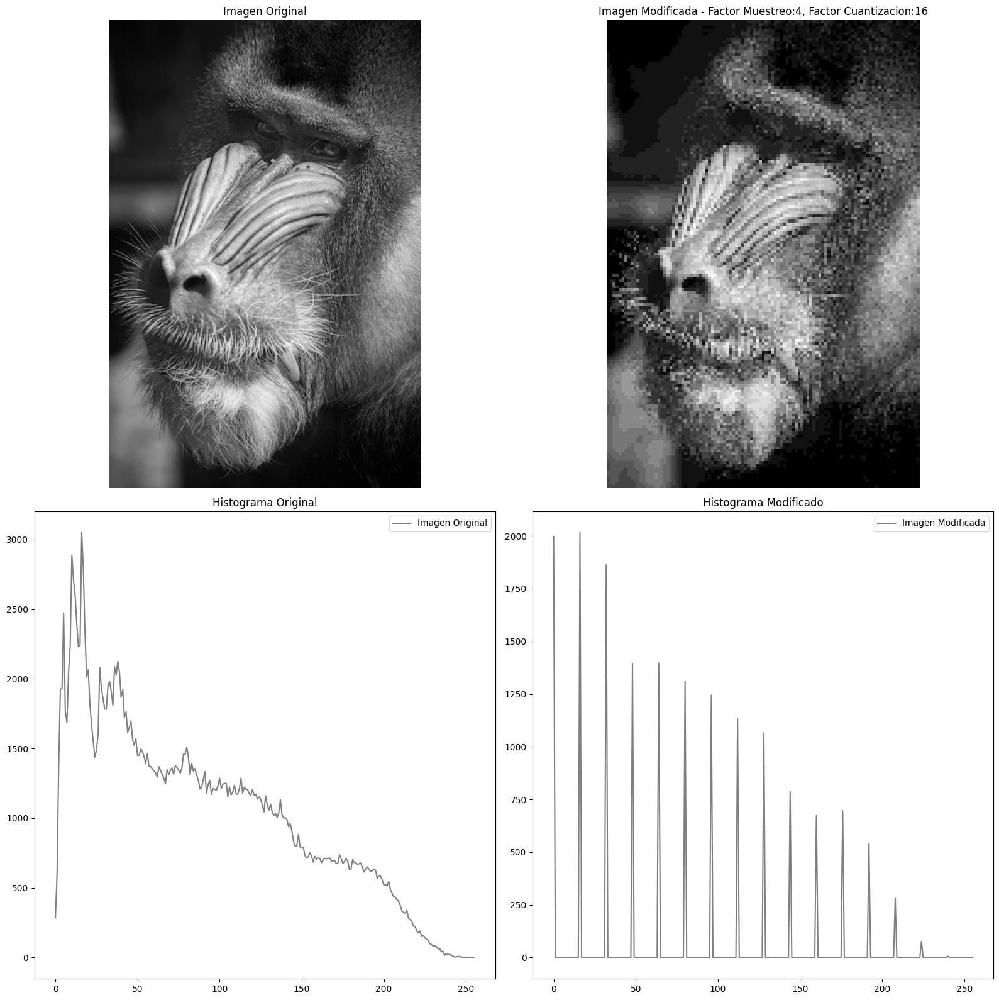


###########################################################
Factor de muestreo: 4 - Factor de cuantizacion: 32
###########################################################



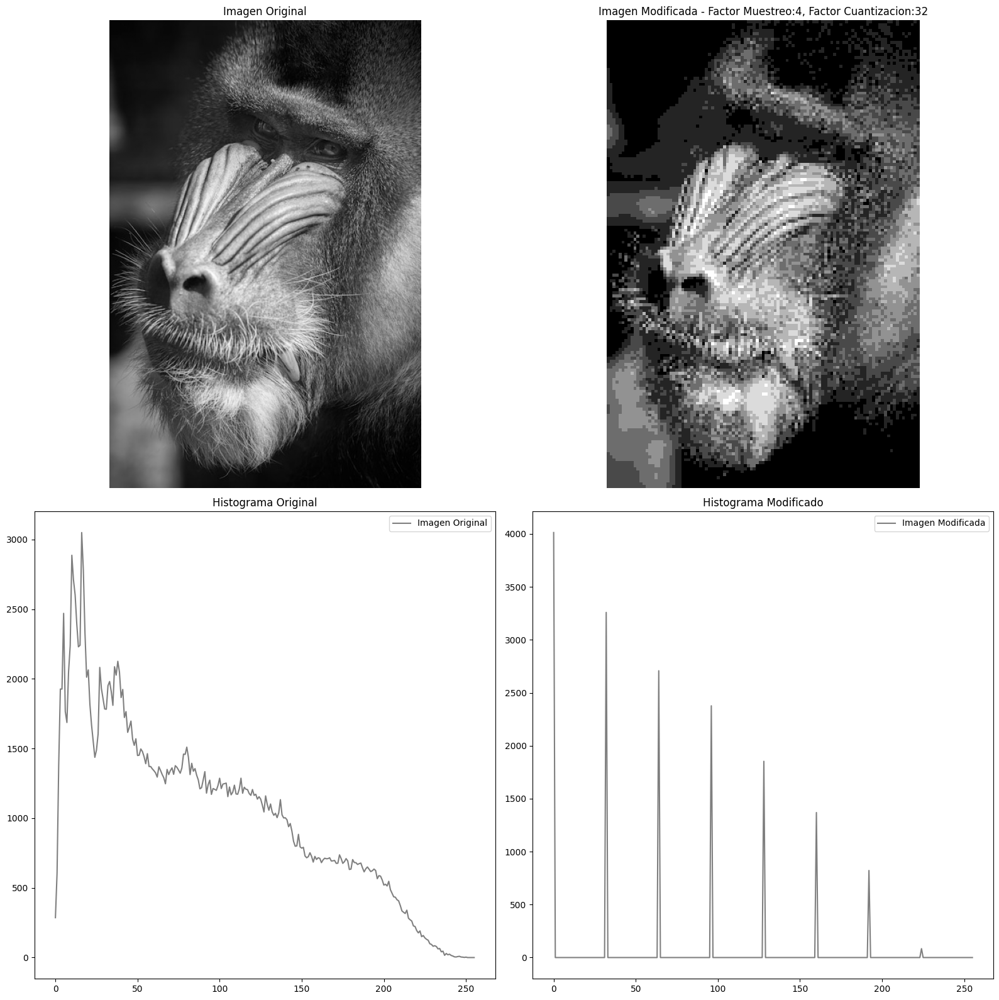


###########################################################
Factor de muestreo: 4 - Factor de cuantizacion: 64
###########################################################



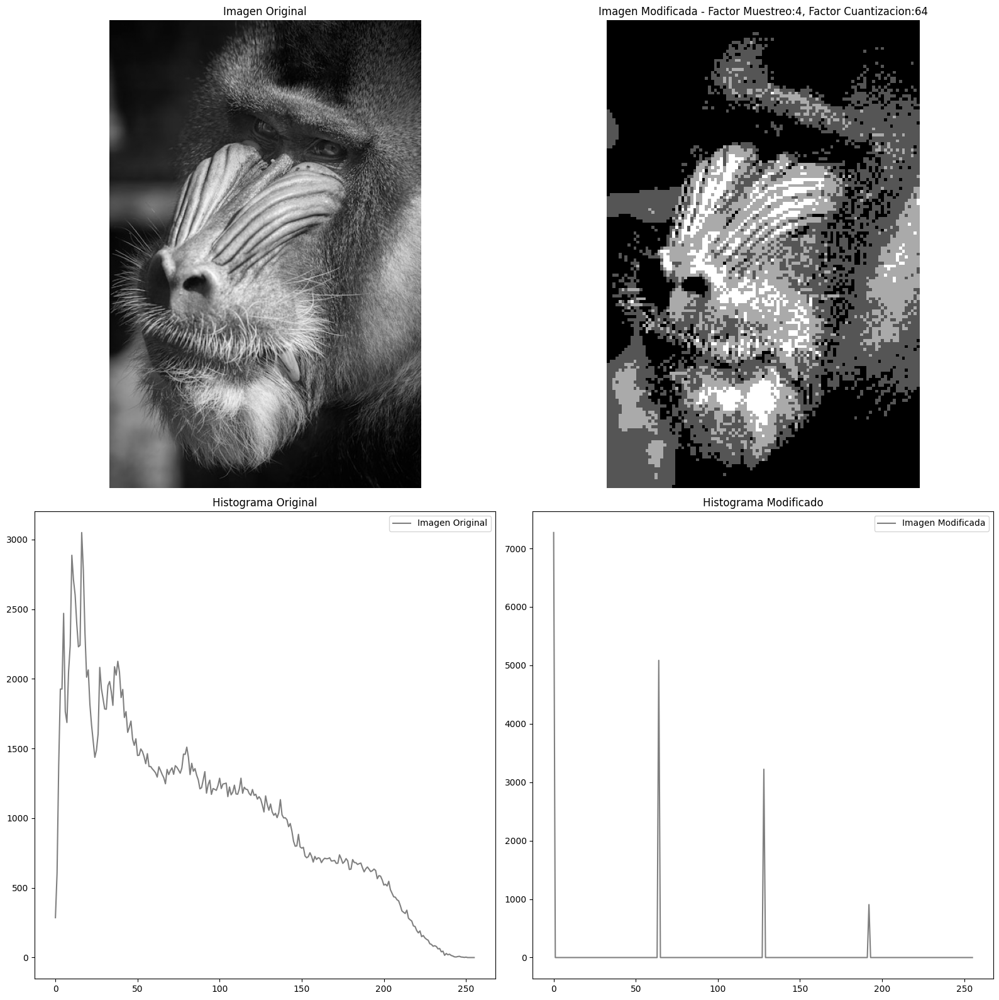


###########################################################
Factor de muestreo: 4 - Factor de cuantizacion: 128
###########################################################



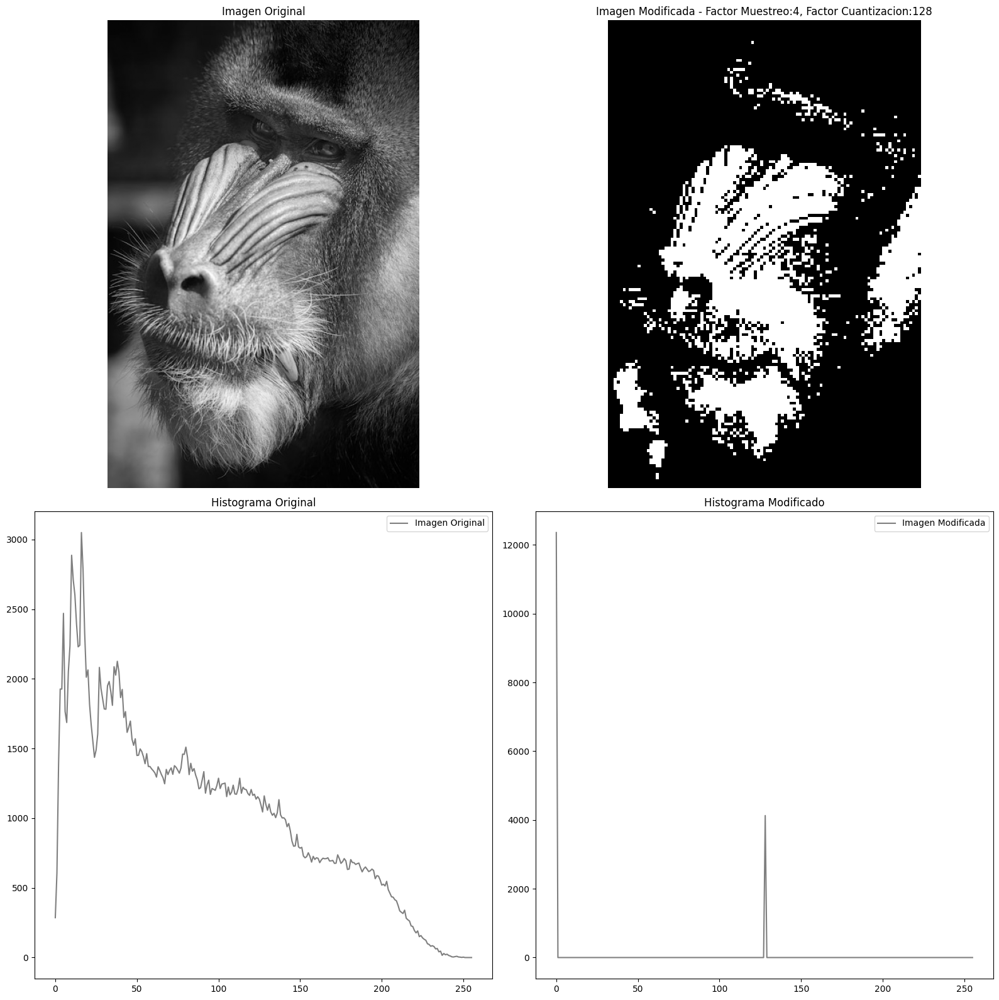


###########################################################
Factor de muestreo: 8 - Factor de cuantizacion: 8
###########################################################



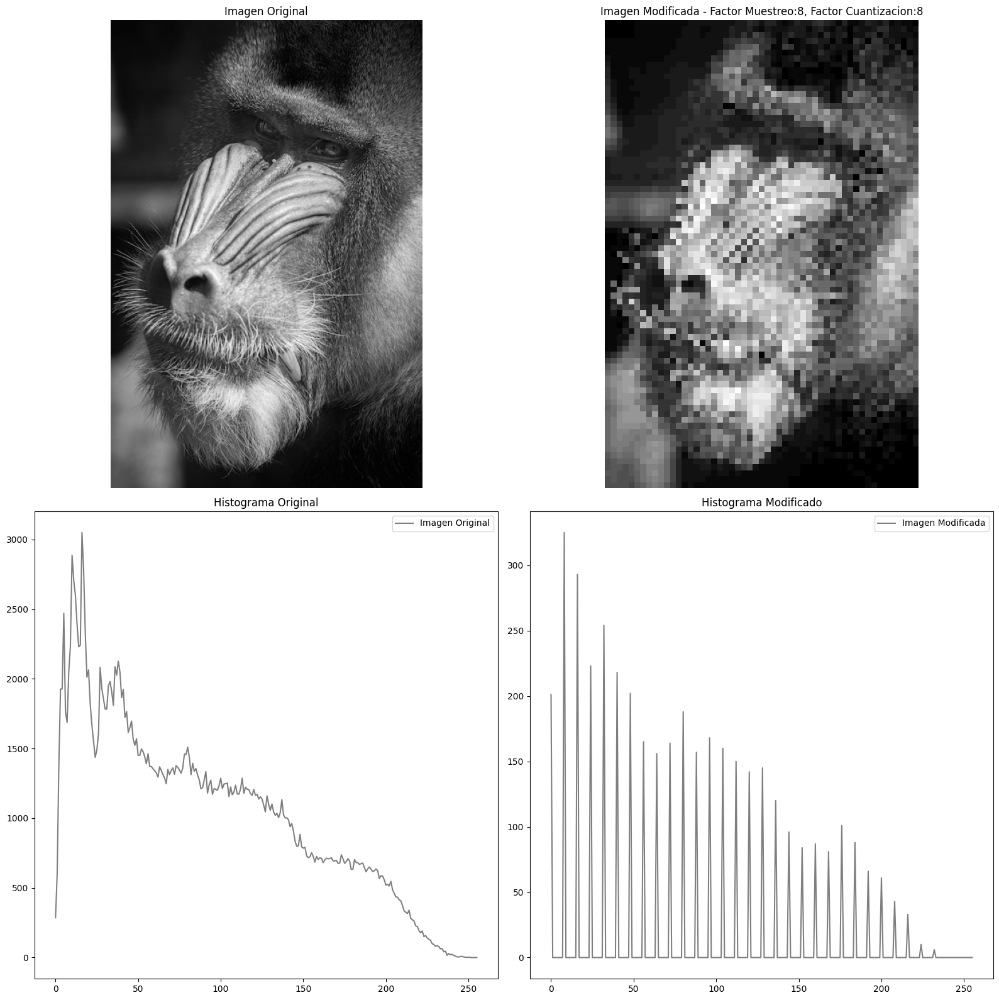


###########################################################
Factor de muestreo: 8 - Factor de cuantizacion: 16
###########################################################



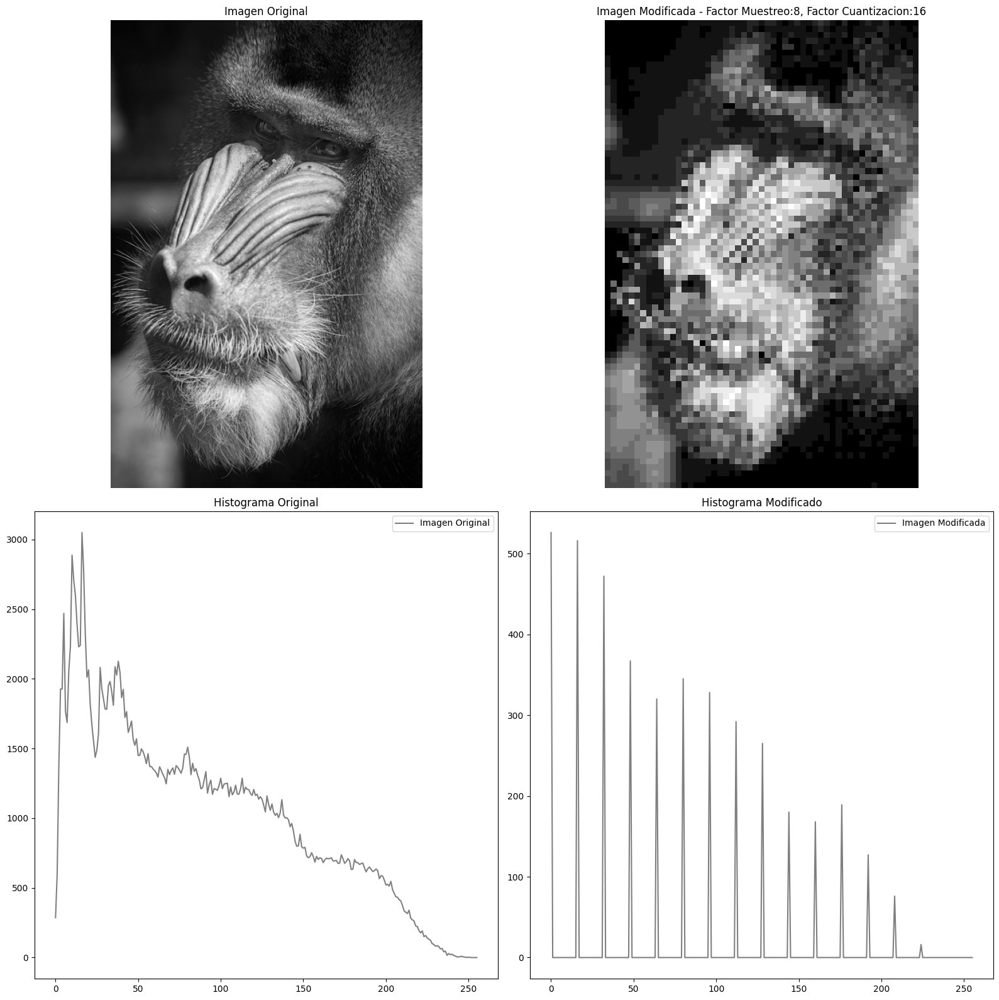


###########################################################
Factor de muestreo: 8 - Factor de cuantizacion: 32
###########################################################



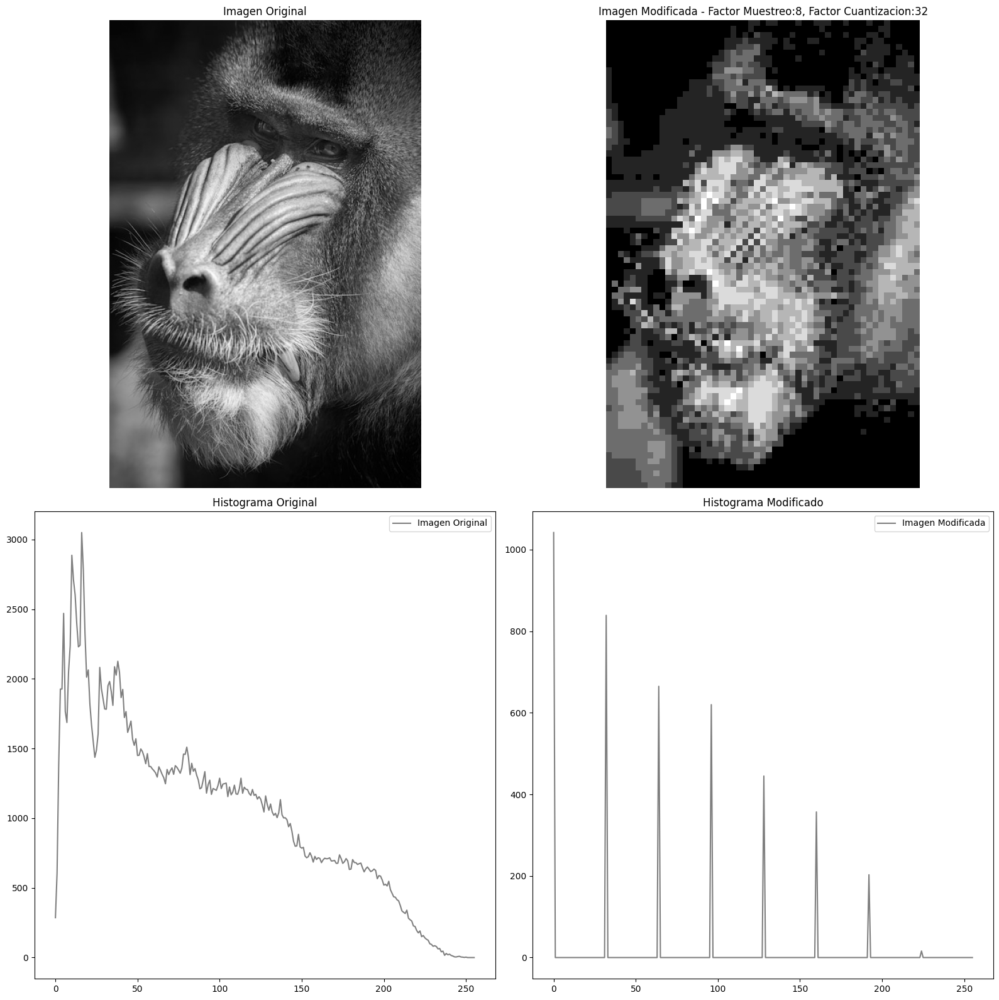


###########################################################
Factor de muestreo: 8 - Factor de cuantizacion: 64
###########################################################



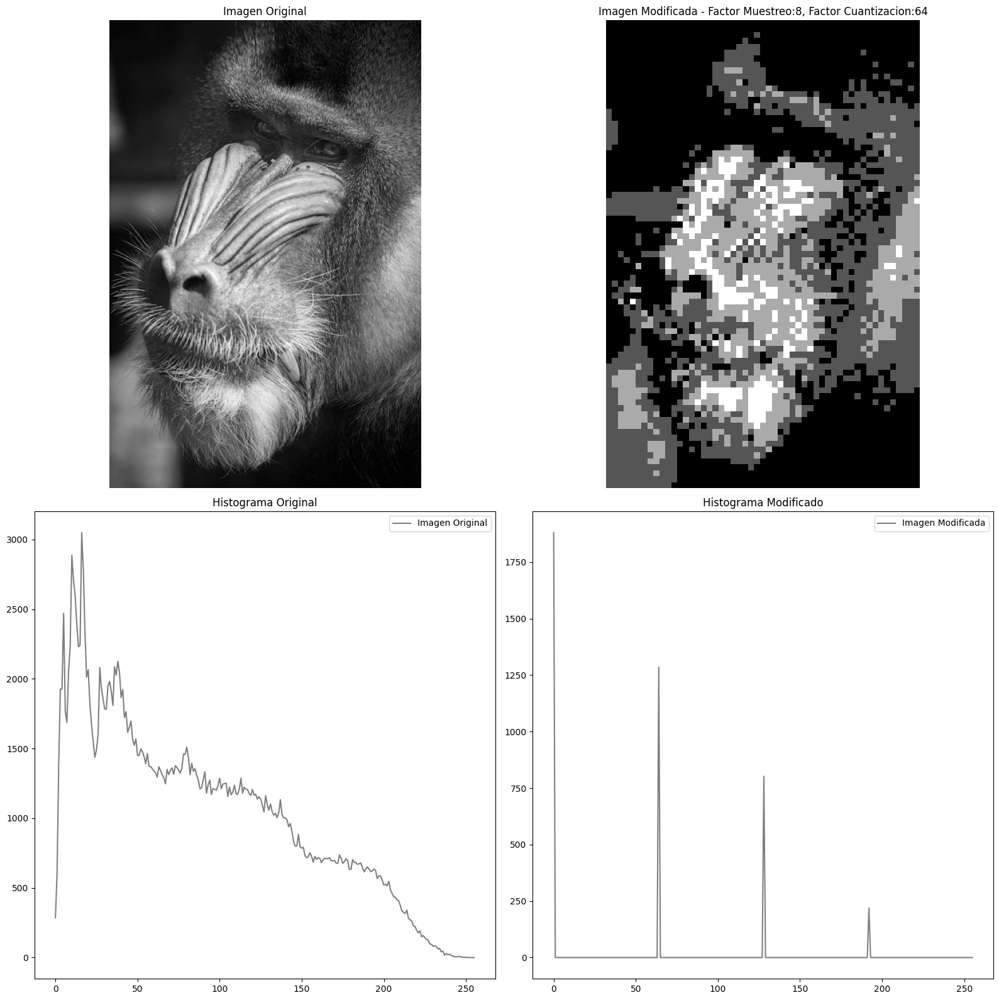


###########################################################
Factor de muestreo: 8 - Factor de cuantizacion: 128
###########################################################



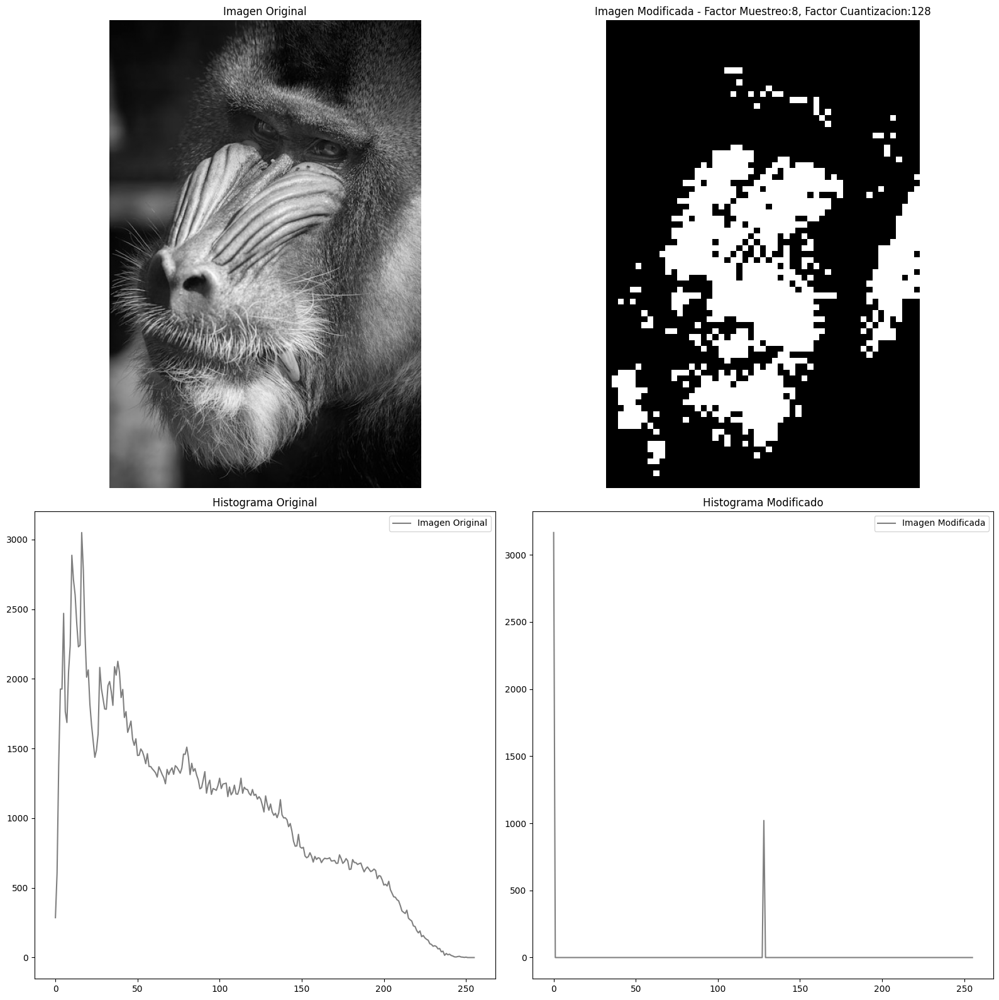

In [22]:
#Creo lista para realizar pruebas
factores_muestreo = [1, 2, 4, 8]
factores_cuantizacion = [8, 16, 32, 64, 128]
for factor_muestreo in factores_muestreo:
    for factor_cuantizacion in factores_cuantizacion:
        imagen_muestreada = resamplear(X.copy(), factor_muestreo)
        imagen_cuantizada = cuantizar(imagen_muestreada.copy(), factor_cuantizacion)
        mostrar(X, imagen_cuantizada, factor_muestreo, factor_cuantizacion)